In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
from math import atan2, hypot # angle and dist
import os
%matplotlib inline
import glob
import time
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split

# 1. Training SVC Classifier

## 1.1 Load Images

In [2]:
def AppendImageInFolder(l, path):
    images_files = glob.glob(path + '/*.png')
    for image in images_files:
        l.append(image)    

cars = []
notcars = []
debug = []
for fn in ['GTI_Far', 'GTI_Left', 'GTI_MiddleClose', 'GTI_Right', 'KITTI_extracted']:
    AppendImageInFolder(cars, 'training_data/vehicles/'+fn)
for fn in ['Extras', 'GTI']:
    AppendImageInFolder(notcars, 'training_data/non-vehicles/'+fn)
AppendImageInFolder(debug, 'debug')
print(len(cars), len(notcars), len(debug))    

8792 8968 124


## 1.2 Image feature extraction

(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)
(8, 8, 1, 1, 9)


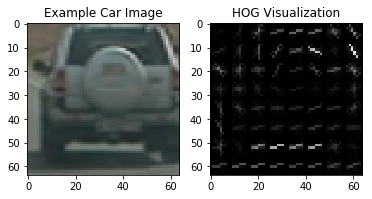

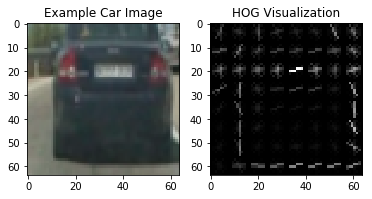

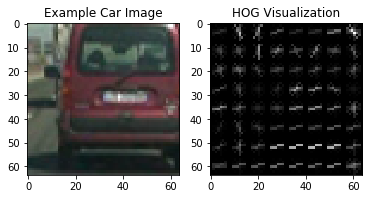

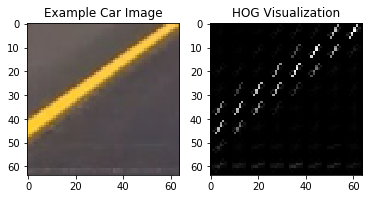

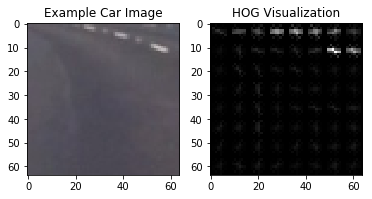

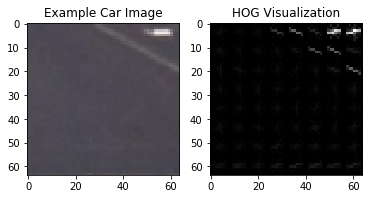

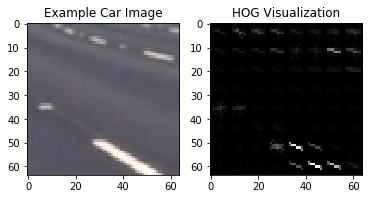

In [102]:
from lessonFunctions import *

# Define a function to return HOG features and visualization   

def DisplayHOG(fn, gray=False):
    image = mpimg.imread(fn)
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    cell_per_block = 1
    channel = 0
    
    if gray:
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)[:,:,channel]
    # Call our function with vis=True to see an image output
    features, hog_image = get_hog_features(feature_image, orient, 
                            pix_per_cell, cell_per_block, 
                            vis=True, feature_vec=False)
    print(features.shape)

    # Plot the examples
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Example Car Image')
    plt.subplot(122)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Visualization')

# Read in the image
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0075.png')
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0005.png')
DisplayHOG('training_data/vehicles/GTI_MiddleClose/image0128.png')
DisplayHOG('training_data/non-vehicles/Extras/extra215.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1061.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1538.png')
DisplayHOG('training_data/non-vehicles/Extras/extra1525.png')


In [13]:
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 1
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
#hog_channel = 2 # Can be 0, 1, 2, or "ALL"
hist_bins = 16
spatial_size=(8, 8)
spatial_feat = True
hist_feat = True
hog_feat = True


t=time.time()
car_features = extract_features(cars, color_space=color_space, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_size=spatial_size, hist_bins = hist_bins,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_size=spatial_size, hist_bins = hist_bins,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
print(car_features.shape)
print(notcar_features.shape)

/home/yingweiy/anaconda3/lib/python3.6/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


59.12 Seconds to extract HOG features...
(8792, 1968)
(8968, 1968)


In [15]:
np.sum(np.isnan(notcar_features))

0

## 1.3 Data Preparation for training

In [16]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations 8 pixels per cell and 1 cells per block
Feature vector length: 1968


## 1.4 Classifier with SVC

In [70]:
# Use a linear SVC 
svc = LinearSVC(C=1e8)
#svc = SVC(C=1e8, gamma=4e-4)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

0.86 Seconds to train SVC...
Test Accuracy of SVC =  0.984


# 2. Sliding Window and Classificaition

In [71]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    off_windows = []
    #2) Iterate over all windows in the list
    cnt=1
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))   
        test_img_gray = cv2.resize(gray_img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))   
        #mpimg.imsave('debug/patch_'+str(cnt).strip()+'.png', test_img, format='png')
        cnt+=1
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, test_img_gray, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
        else:
            off_windows.append(window)
    #8) Return windows for positive detections
    return on_windows, off_windows

In [72]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                 xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0] * (1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1] * (1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0] * (xy_overlap[0]))
    ny_buffer = np.int(xy_window[1] * (xy_overlap[1]))
    nx_windows = np.int((xspan - nx_buffer) / nx_pix_per_step)
    ny_windows = np.int((yspan - ny_buffer) / ny_pix_per_step)    
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs * nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys * ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]

            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [103]:
def DetectCar(fn, horizon_y=500):
    image = mpimg.imread(fn)

    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    image = image.astype(np.float32)/255

    windows = []
    
    for ws in [64, 96, 128, 160, 192, 256]:
        if ws <= 64:
            s=2
        elif ws<160:
            s=1
        else:
            s=1
        y_stop = min(horizon_y+ws*s, image.shape[0])
        cur_windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, y_stop], 
                        xy_window=(ws, ws), xy_overlap=(0.75, 0.75))
        windows += cur_windows
    
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    hot_windows, off_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=2)  
    fns = fn.split('/')
    mpimg.imsave('output_images/'+fns[1], window_img, format='jpg')
    plt.figure(figsize=(18,12))
    plt.imshow(window_img)
    return hot_windows

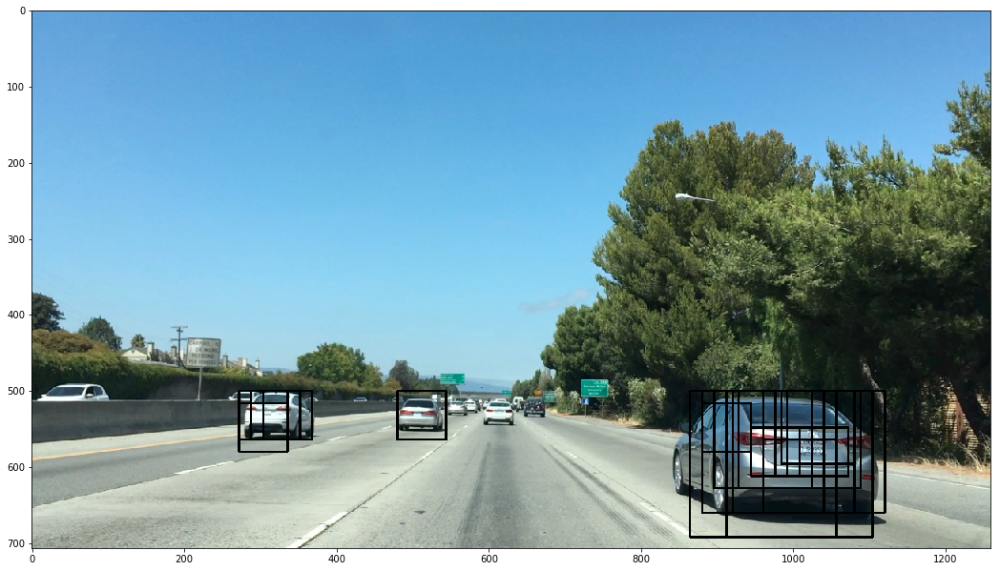

In [104]:
hw=DetectCar('test_images/bbox-example-image.png')

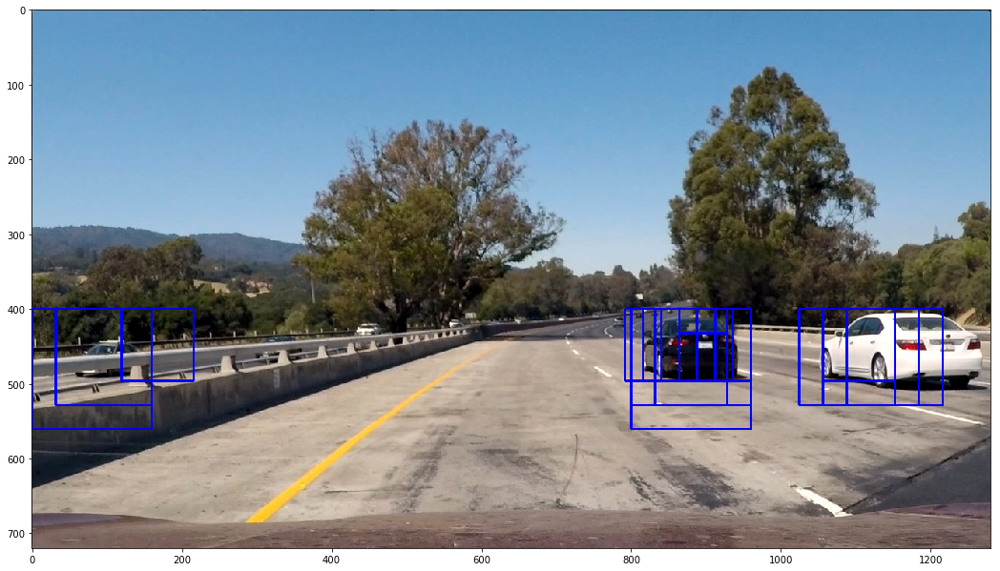

In [105]:
hw=DetectCar('test_images/test1.jpg', horizon_y=400)

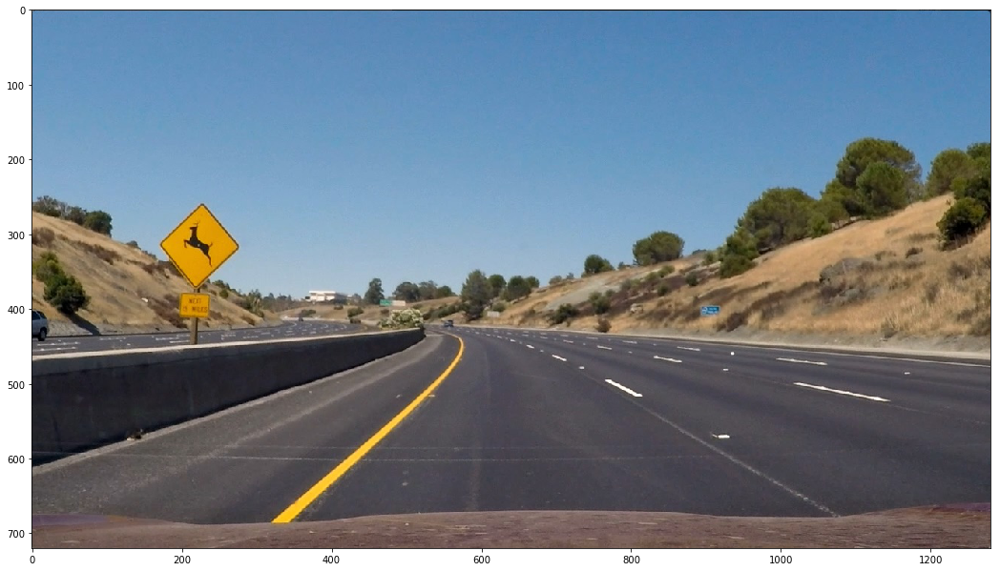

In [106]:
hw=DetectCar('test_images/test2.jpg', horizon_y=400)

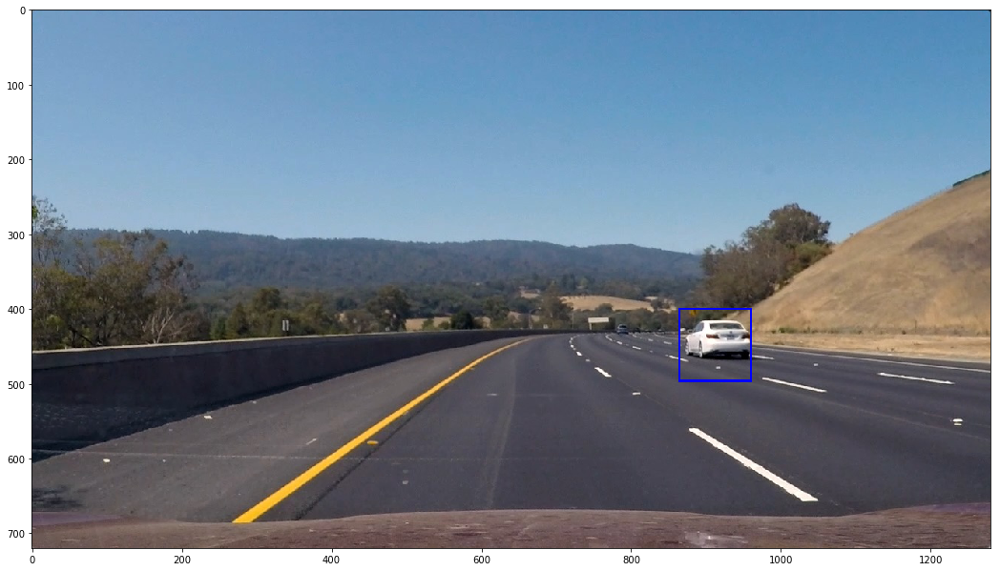

In [107]:
hw=DetectCar('test_images/test3.jpg', horizon_y=400)

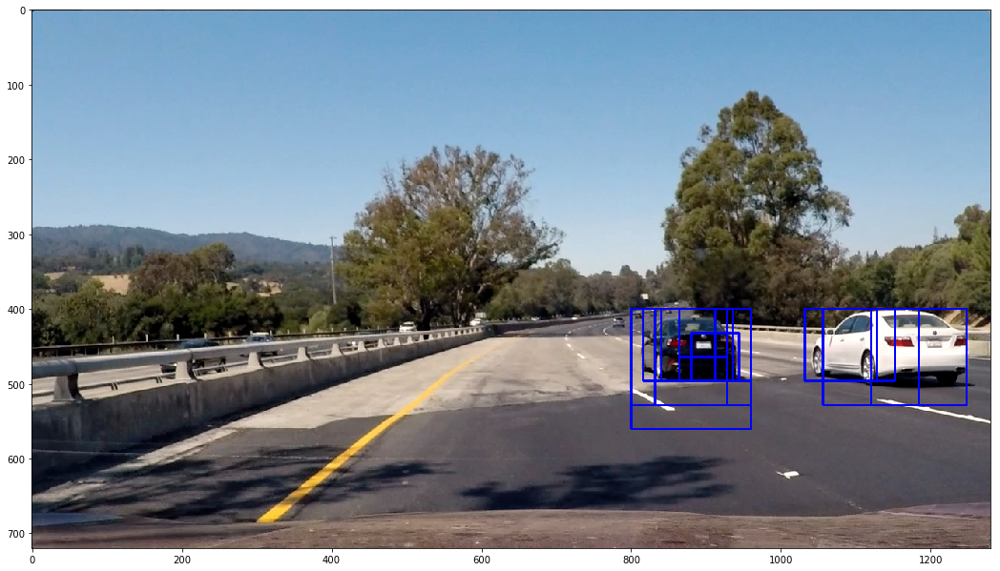

In [108]:
hw=DetectCar('test_images/test4.jpg', horizon_y=400)

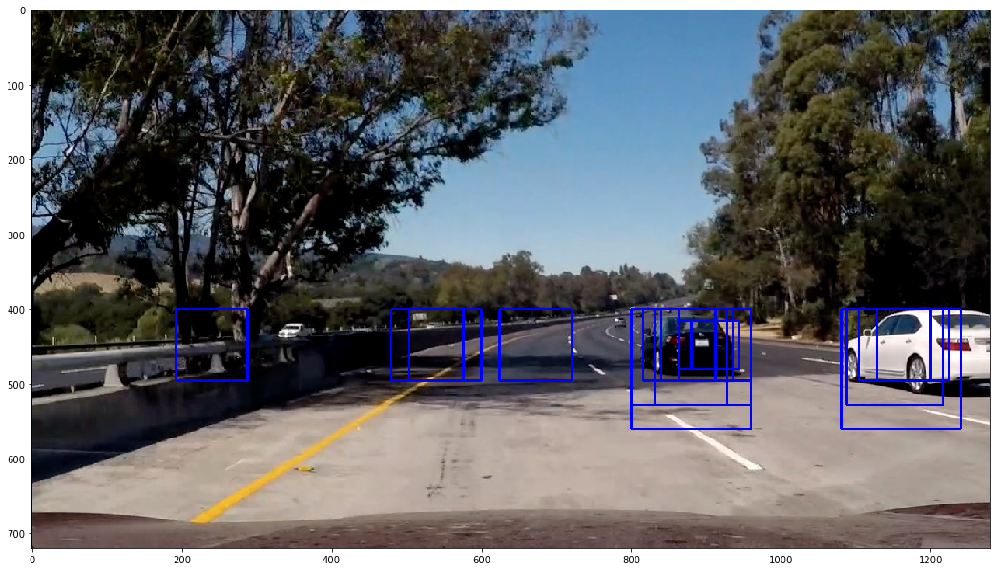

In [109]:
hw=DetectCar('test_images/test5.jpg', horizon_y=400)

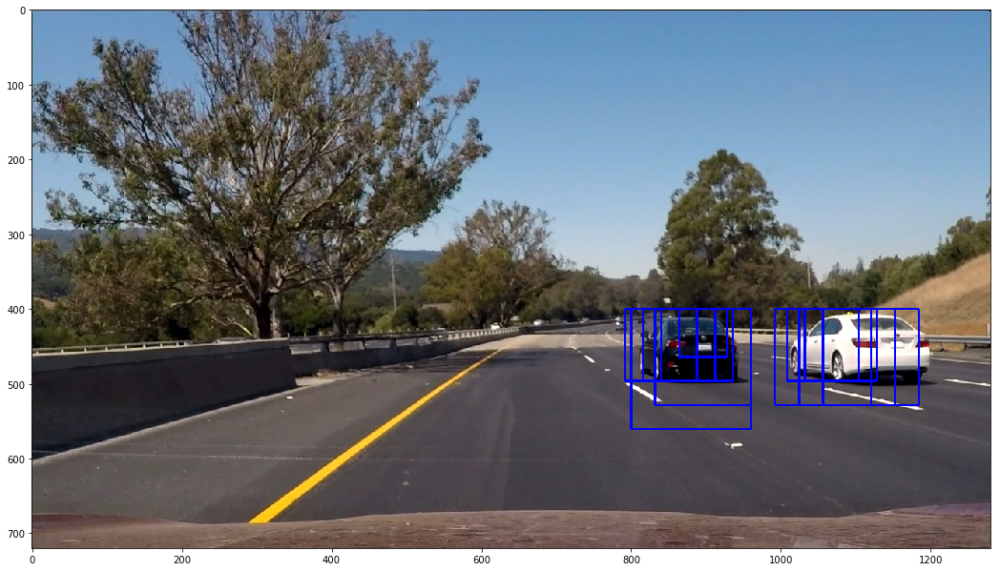

In [110]:
hw = DetectCar('test_images/test6.jpg', horizon_y=400)

## Heatmap

In [81]:
from scipy.ndimage.measurements import label

In [82]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (255,0,0), 3)
    # Return the image
    return img

In [97]:
from collections import deque
history = deque(maxlen = 8)

def PipeLine(image, use_hist=True, save=False):    
    horizon_y=400
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    pixel_max = np.max(image)
    if pixel_max>1.1: #jpeg format
        image = image.astype(np.float32)/255

    windows = []
    
    for ws in [48, 64, 96, 128, 160, 192]:
        if ws <= 96:
            s=2
        elif ws<160:
            s=1
        else:
            s=1
        y_stop = min(horizon_y+ws*s, image.shape[0])
        cur_windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, y_stop], 
                        xy_window=(ws, ws), xy_overlap=(0.75, 0.75))
        windows += cur_windows

    hot_windows, off_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       
    
        
    fns = fn.split('/')
    
    # Add heat to each box in box list
    heat = add_heat(heat, hot_windows)
    threshold = 1
    if use_hist:
        history.append(heat)
        heat = np.sum(np.array(history), axis=0)
        threshold = 1+len(history)//2
    if save:
        mpimg.imsave('output_images/heat_'+fns[1], heat, format='jpg')
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    if save:
        plt.imshow(labels[0], cmap='gray')
        mpimg.imsave('output_images/th_'+fns[1], labels[0], format='jpg')

    
    result_img = draw_labeled_bboxes(draw_image, labels)
    if save:
        mpimg.imsave('output_images/label_'+fns[1], result_img, format='jpg')
    
    return result_img

In [111]:
fn = 'test_images/test4.jpg'
image = mpimg.imread(fn)
windows = []
horizon_y=400
for ws in [64, 96, 128, 160, 192, 256]:
    y_stop = min(horizon_y+ws, image.shape[0])
    cur_windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[horizon_y, y_stop], 
                    xy_window=(ws, ws), xy_overlap=(0.75, 0.75))
    windows += cur_windows    
win_img = draw_boxes(image, windows, color=(0, 0, 255), thick=2) 
mpimg.imsave('output_images/windows.jpg', win_img, format='jpg')

test_images/test3.jpg


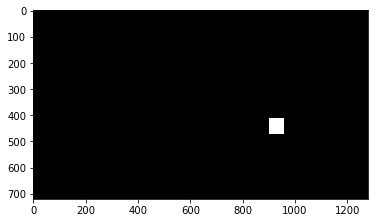

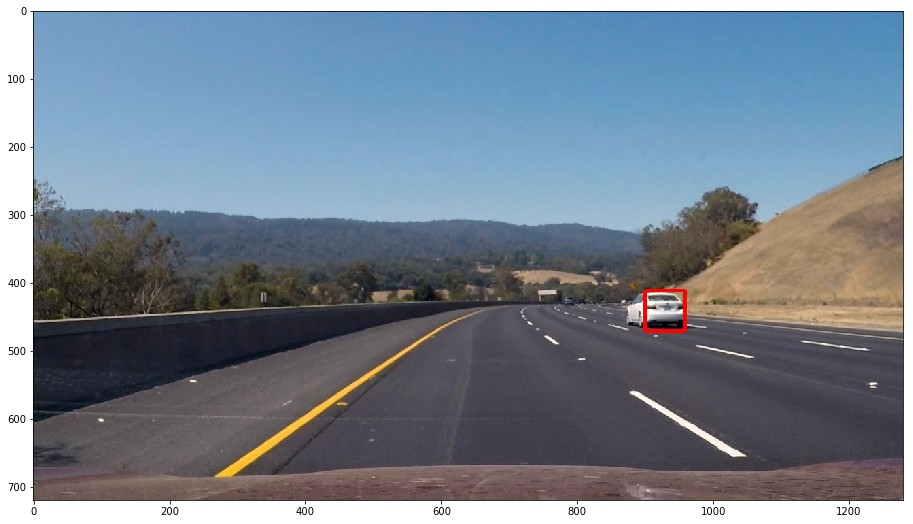

test_images/test1.jpg


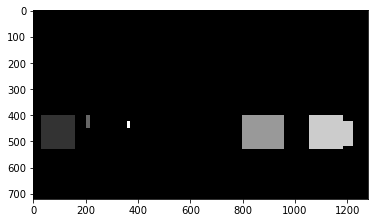

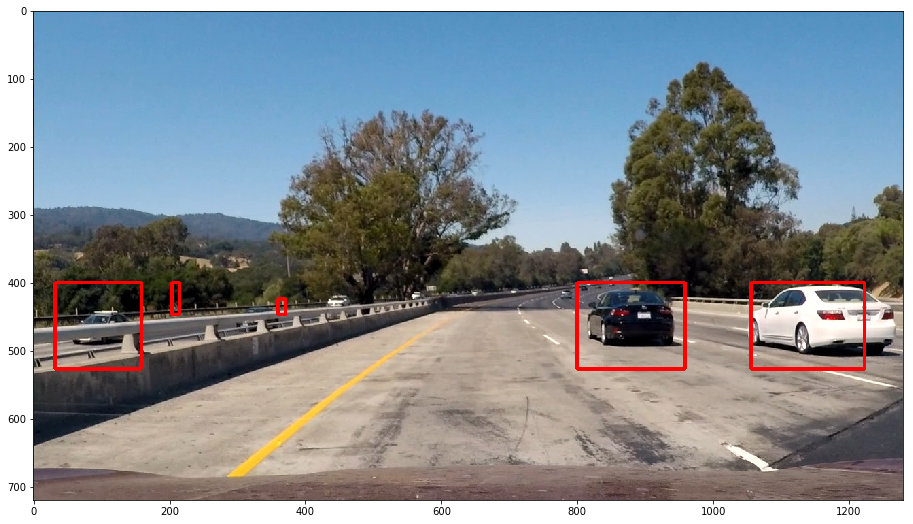

test_images/test5.jpg


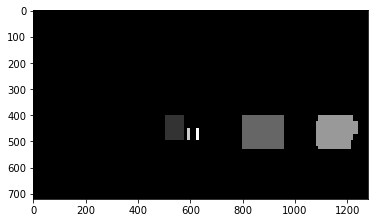

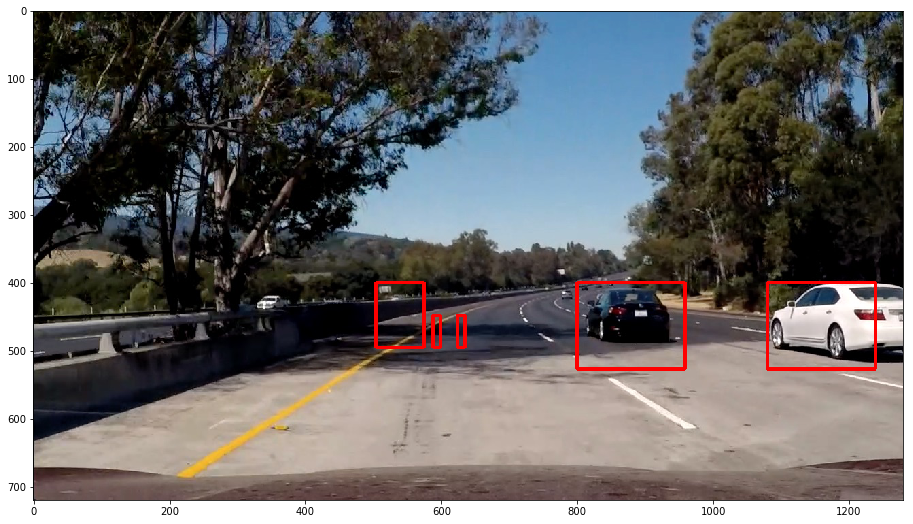

test_images/test4.jpg


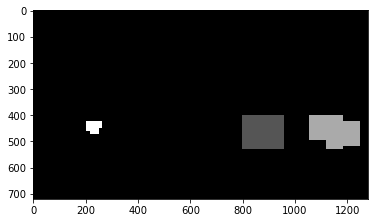

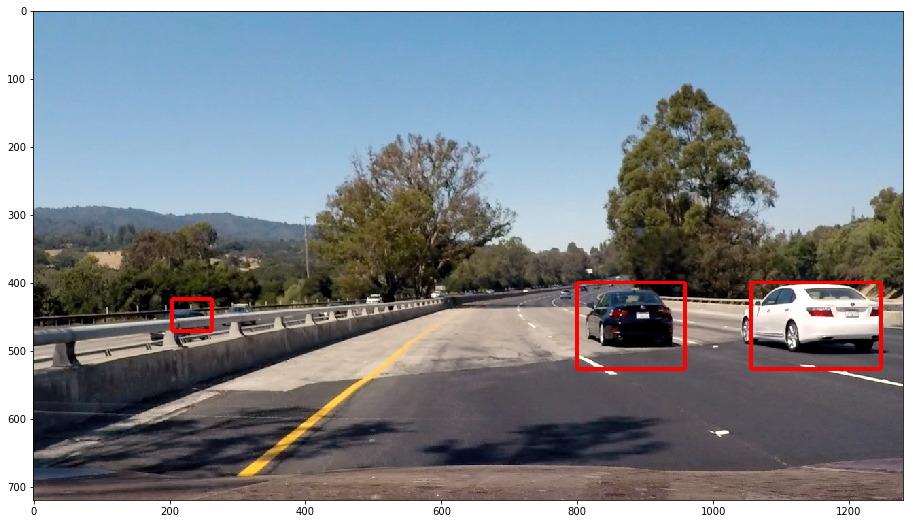

test_images/test2.jpg


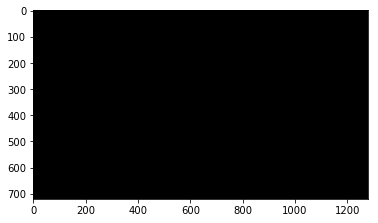

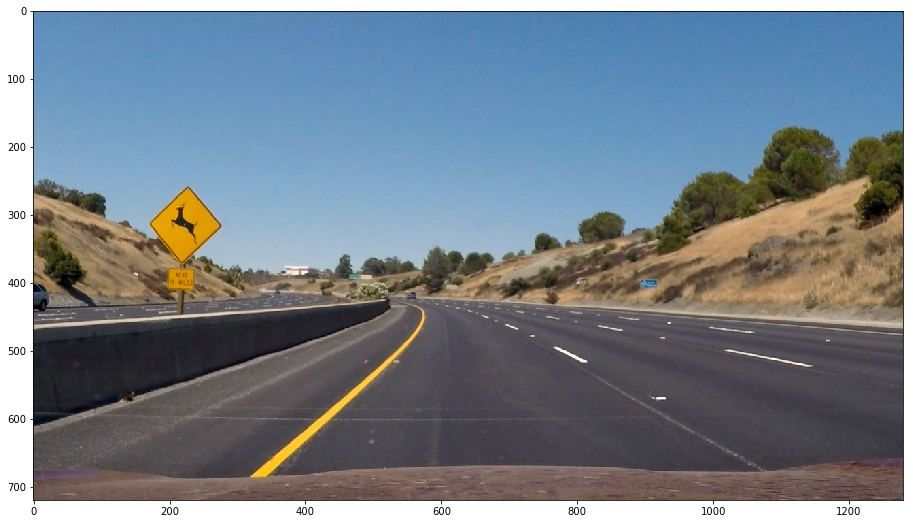

test_images/test6.jpg


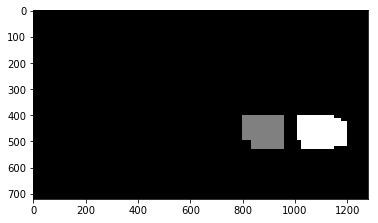

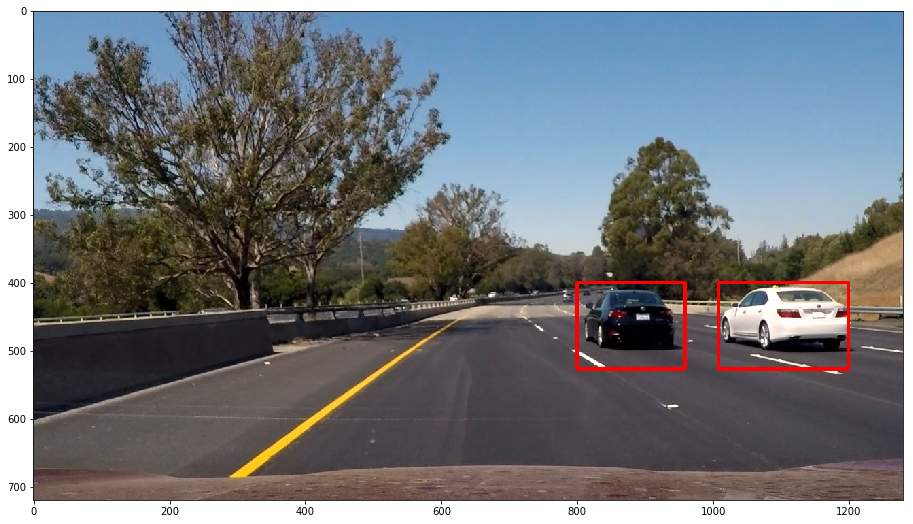

In [96]:
images_files = glob.glob('test_images/*.jpg')
for fn in images_files:
    print(fn)
    image = mpimg.imread(fn)
    result = PipeLine(image, use_hist=False, save=True)
    fig = plt.figure(figsize=(18,9))
    plt.imshow(result)
    plt.show()

# Processing Video

In [86]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [68]:
clip_output = 'test_video_output.mp4'
clip1 = VideoFileClip("test_video.mp4")
cnt=0
processor = clip1.fl_image(PipeLine) #NOTE: this function expects color images!!
%time processor.write_videofile(clip_output, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4



 10%|█         | 4/39 [00:39<05:42,  9.78s/it]

 97%|█████████▋| 38/39 [06:11<00:09,  9.79s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

CPU times: user 6min 15s, sys: 156 ms, total: 6min 16s
Wall time: 6min 12s


In [100]:
clip_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4") #.subclip(23, 28)
cnt=0
processor = clip1.fl_image(PipeLine) #NOTE: this function expects color images!!
%time processor.write_videofile(clip_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [1:18:10<00:03,  3.72s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1h 20min 26s, sys: 5.74 s, total: 1h 20min 32s
Wall time: 1h 18min 11s
